# Pet-проект : EDA - Price prediction - Cluster analysis - Streamlit

In [1]:
#Библиотеки для работы с данными 
import pandas as pd
import numpy as np
from math import radians, sin, cos, sqrt, atan2
import warnings
warnings.filterwarnings("ignore")
import joblib


#Библиотеки для визуализации данных
from IPython.display import Image
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.subplots as sp
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
import plotly.io as pio
pio.renderers.default='notebook'

#Библиотеки для машинного обучения
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neural_network import MLPRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, silhouette_score, davies_bouldin_score, calinski_harabasz_score, classification_report 

## Цель проекта - построение модели по предсказанию цены на дома в Нью-Йорке и проведение кластеризации для распределение домов на классы: эконом, комфорт, бизнес, элитный и разработка веб-сервиса

## Задачи: 
### 1. Проведение EDA 
### 2. Построение модели, подбор параметров для обучения, выбор лучшей 
### 3. Проведение кластеризации и вывод полученных кластеров на карту
### 4. Построение прототип сервиса на библиотеке Streamlit
### 5. Итог

In [2]:
display(Image(url='https://tripmydream.cc/travelhub/travel/blocks/14/5239/block_145239.jpg?v1', 
              width = 1920) 
       )

In [3]:
data = pd.read_csv('NY-House-Dataset.csv')
df = data.copy()
data.head()

,BROKERTITLE,TYPE,PRICE,BEDS,BATH,PROPERTYSQFT,ADDRESS,STATE,MAIN_ADDRESS,ADMINISTRATIVE_AREA_LEVEL_2,LOCALITY,SUBLOCALITY,STREET_NAME,LONG_NAME,FORMATTED_ADDRESS,LATITUDE,LONGITUDE
0,Brokered by Douglas Elliman -111 Fifth Ave,Condo for sale,315000,2,2.000000,1400.0,2 E 55th St Unit 803,"New York, NY 10022","2 E 55th St Unit 803New York, NY 10022",New York County,New York,Manhattan,East 55th Street,Regis Residence,"Regis Residence, 2 E 55th St #803, New York, N...",40.761255,-73.974483
1,Brokered by Serhant,Condo for sale,195000000,7,10.000000,17545.0,Central Park Tower Penthouse-217 W 57th New Yo...,"New York, NY 10019",Central Park Tower Penthouse-217 W 57th New Yo...,United States,New York,New York County,New York,West 57th Street,"217 W 57th St, New York, NY 10019, USA",40.766393,-73.980991
2,Brokered by Sowae Corp,House for sale,260000,4,2.000000,2015.0,620 Sinclair Ave,"Staten Island, NY 10312","620 Sinclair AveStaten Island, NY 10312",United States,New York,Richmond County,Staten Island,Sinclair Avenue,"620 Sinclair Ave, Staten Island, NY 10312, USA",40.541805,-74.196109
3,Brokered by COMPASS,Condo for sale,69000,3,1.000000,445.0,2 E 55th St Unit 908W33,"Manhattan, NY 10022","2 E 55th St Unit 908W33Manhattan, NY 10022",United States,New York,New York County,New York,East 55th Street,"2 E 55th St, New York, NY 10022, USA",40.761398,-73.974613
4,Brokered by Sotheby's International Realty - E...,Townhouse for sale,55000000,7,2.373861,14175.0,5 E 64th St,"New York, NY 10065","5 E 64th StNew York, NY 10065",United States,New York,New York County,New York,East 64th Street,"5 E 64th St, New York, NY 10065, USA",40.767224,-73.969856


Загрузка данных и проверка пропущенных значений

In [4]:
data.isna().sum()

BROKERTITLE                    0
TYPE                           0
PRICE                          0
BEDS                           0
BATH                           0
PROPERTYSQFT                   0
ADDRESS                        0
STATE                          0
MAIN_ADDRESS                   0
ADMINISTRATIVE_AREA_LEVEL_2    0
LOCALITY                       0
SUBLOCALITY                    0
STREET_NAME                    0
LONG_NAME                      0
FORMATTED_ADDRESS              0
LATITUDE                       0
LONGITUDE                      0
dtype: int64

Итог: пропущенных элементов не было найдено 

# 1. Проведение EDA

In [5]:
def distribution(column_name: str):
    plt.figure(figsize=(4, 8))
    sns.histplot(data[column_name], bins=50, kde=True, color='skyblue', edgecolor='black')
    plt.ylim(0,600)
    
    mean_values = data[column_name].mean()
    plt.axvline(mean_values, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_values}')
    
    plt.title(f'Distribution of {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.xticks()
    plt.legend() 
    plt.show()

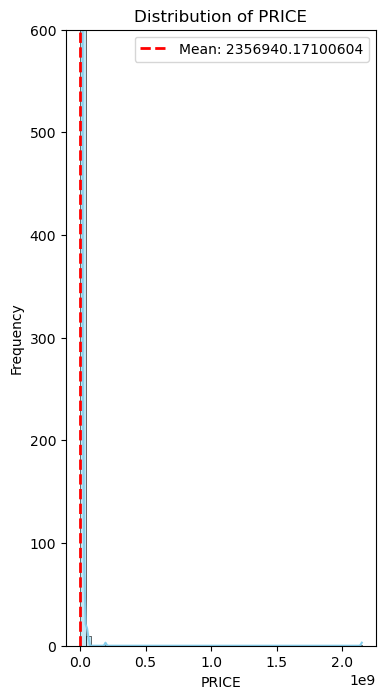

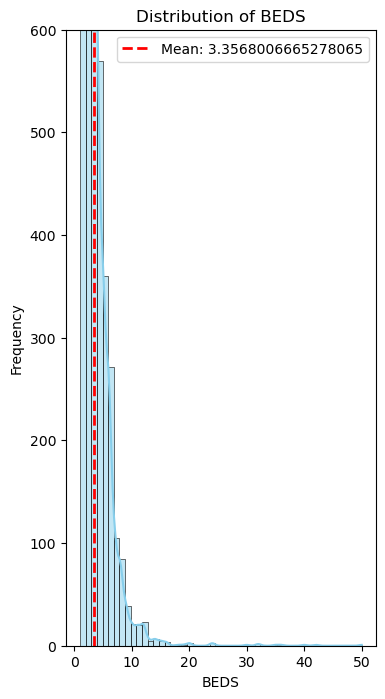

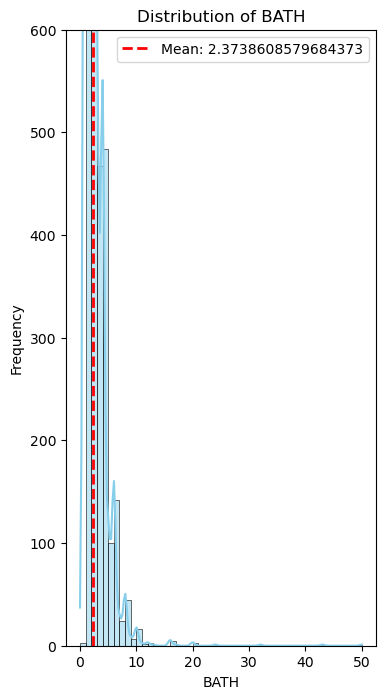

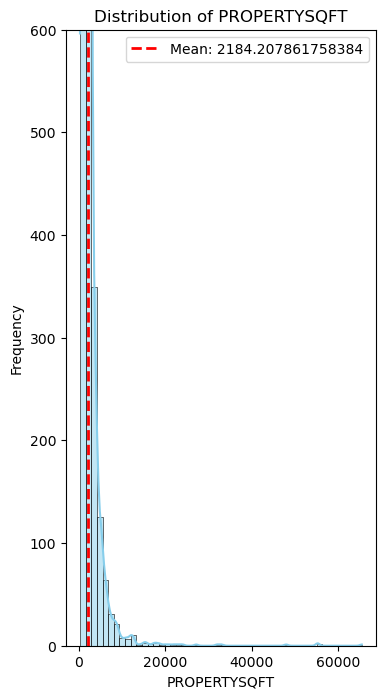

In [6]:
columns_for_histogram = ['PRICE','BEDS','BATH','PROPERTYSQFT']

for column in columns_for_histogram:
    distribution(column)

In [7]:
columns_for_boxplot = ['BEDS', 'BATH', 'PROPERTYSQFT', 'PRICE']

def boxplot(column):
    fig = px.box(data, y=column)
    fig.show()
    fig.update_layout(
        width=600,  
        height=600,  
   )

for column in columns_for_boxplot:
    boxplot(column)

Присутствуют выбросы в числовых признаках

In [8]:
data_for_corr = data.select_dtypes(include=['number']).corr()
data_for_corr = np.round(data_for_corr, 2)
np.fill_diagonal(data_for_corr.values, 0)

fig = px.imshow(data_for_corr, text_auto=True,aspect="auto", color_continuous_scale='Bluered_r', zmin = -1, zmax = 1, height=800, width=800)
fig.show()

Так как коэффициент корреляции низкий, поэтому строить линейную регрессию бесполезно - построим [lowess](https://en.wikipedia.org/wiki/Local_regression)

In [9]:
def scatter(column):
    fig = px.scatter(data, x = f'{column}', y = 'PRICE', trendline='lowess', color='PRICE')
    fig.update_layout(
        width=600,  
        height=600,  
   )
    fig.show()

In [10]:
columns_for_scatter = ['BEDS', 'PROPERTYSQFT', 'BATH']

for column in columns_for_scatter:
   scatter(column)

Во всех трех признаках существует прямая зависимость по отношению к цене

### Построим карты с топ 100 дешевыми домами и топ 100 дорогими

In [11]:
df_sorted = data.sort_values(by='PRICE')

my_map_cheap_houses = folium.Map(location=[df_sorted['LATITUDE'].mean(), df_sorted['LONGITUDE'].mean()], zoom_start=10.5)

for index, row in df_sorted.head(100).iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=f"{row['STREET_NAME']}\nЦена: {row['PRICE']}",
        icon=folium.Icon(color='green', icon='home')
    ).add_to(my_map_cheap_houses)

my_map_cheap_houses

In [12]:
df_sorted = data.sort_values(by='PRICE')

my_map_expensive_houses = folium.Map(location=[df_sorted['LATITUDE'].mean(), df_sorted['LONGITUDE'].mean()], zoom_start=10.5)

for index, row in df_sorted.tail(100).iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=f"{row['STREET_NAME']}\nЦена: {row['PRICE']}",
        icon=folium.Icon(color='red', icon='home')
    ).add_to(my_map_expensive_houses)

my_map_expensive_houses

### Получим из столбца TYPE признак **"Тип недвижимости"**

In [13]:
data["TYPE"] = data["TYPE"].apply(lambda row: row.removesuffix(" for sale"))

Так как у нас получились слова, которые не относятся к какому-то типу недвижимости (Coming Soon, Pending, Contingent, Foreclosure и так далее) надо найти к какому слову (кластеру) они будут похоже больше всего, и из полученной последовательности слов привести к одному - общему слову, обозначающего тип недвижимости

In [14]:
# Преобразование категориального столбца "Type" в векторы
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(data['TYPE']) # data - ваш датасет

# Применение метода кластеризации KMeans
kmeans = KMeans(n_clusters=7)
kmeans.fit(X)

# Вывод результата кластеризации
clusters = kmeans.labels_

# Добавление информации о кластерах к датасету
data['Cluster'] = clusters

# Вывод уникальных типов домов в каждом кластере
for i in range(8):
    print(f"Cluster {i+1} - Types: {data[data['Cluster'] == i]['TYPE'].unique()}")

data.drop('Cluster',axis=1, inplace=True)

Cluster 1 - Types: ['Townhouse' 'For sale' 'Land' 'Foreclosure' 'Coming Soon' 'Condop']
Cluster 2 - Types: ['Co-op']
Cluster 3 - Types: ['Multi-family home']
Cluster 4 - Types: ['House' 'Mobile house']
Cluster 5 - Types: ['Condo']
Cluster 6 - Types: ['Pending']
Cluster 7 - Types: ['Contingent']
Cluster 8 - Types: []


Условно отнесем ***Contingent*** к Condop и ***Mobile house*** к house

In [15]:
dictionary_of_type = {
    'For sale' : 'Condop',
    'Foreclosure' : 'Condop',
    'Pending' : 'Condop',
    'Coming Soon' : 'Condop',
    'Contingent' : 'Condop',
    'Mobile house' : 'House'
}

In [16]:
data['TYPE'] = data['TYPE'].replace(dictionary_of_type)
type_data = data['TYPE'].value_counts().reset_index()

In [17]:
fig = px.pie(
    values=type_data['count'].values,
    names=type_data['TYPE'].values,  
    title='Distribution of type of sell houses',  
    color_discrete_sequence=px.colors.qualitative.Set1,  
    hole=0.2      
)

fig.update_traces(textposition='inside', textinfo='label+percent')

Топ 3 типа недвижимости: **Co-op**, **House**, **Condo** 

In [18]:
type_data = data.groupby('TYPE')['PRICE'].mean().reset_index()

In [19]:
fig = px.bar(type_data, x='TYPE', y='PRICE', title='Average Price by House Type', color = 'TYPE')
fig.update_layout(title_x=0.5)  # Центрировать заголовок
fig.show()

Топ 3 самых дорогих типа недвижимости: **Townhouse**, **House**, **Condo**

### Получи из столбца SUBLOCALITY признак **"Район"**

In [20]:
data['SUBLOCALITY'].value_counts()

SUBLOCALITY
New York            1016
Kings County         727
Queens County        684
Queens               555
Richmond County      480
Brooklyn             464
Bronx County         307
New York County      286
The Bronx            184
Staten Island         59
Manhattan             21
Riverdale              4
Flushing               4
Coney Island           3
East Bronx             1
Brooklyn Heights       1
Jackson Heights        1
Rego Park              1
Fort Hamilton          1
Dumbo                  1
Snyder Avenue          1
Name: count, dtype: int64

In [21]:
dictionary_of_borough = {
    'New York' : 'New York',
    'Queens' : 'Queens',
    'Brooklyn' : 'Kings',
    'The Bronx' : 'Bronx',
    'Staten Island' : 'Richmond',
    'Manhattan' : 'New York',
    'Kings County' : 'Kings',
    'Queens County' : 'Queens',
    'Richmond County' : 'Richmond',
    'Bronx County' : 'Bronx',
    'New York County' : 'New York',
    'Riverdale' : 'Bronx',
    'Flushing' : 'Queens',
    'Coney Island' : 'Kings',
    'East Bronx' : 'Bronx',
    'Brooklyn Heights' : 'Kings',
    'Jackson Heights' : 'Queens',
    'Rego Park' : 'Queens',
    'Fort Hamilton' : 'Kings',
    'Dumbo' : 'Kings',
    'Snyder Avenue' : 'Kings'
 
}

In [22]:
data['District'] = data['SUBLOCALITY'].map(dictionary_of_borough)

In [23]:
data['District'].value_counts()

District
New York    1323
Queens      1245
Kings       1198
Richmond     539
Bronx        496
Name: count, dtype: int64

In [24]:
district_type_mean_price = data.groupby(['District', 'TYPE'])['PRICE'].mean().reset_index()

fig = px.bar(district_type_mean_price, 
             x='District', 
             y='PRICE', 
             color='TYPE', 
             title='Average Price by House Type in Different Districts',
             labels={'District': 'District', 'PRICE': 'Average Price', 'TYPE': 'House Type'}
            )
fig.show()

По графику можем понять, что **New York** имеет в среднем самую дорогую недвижимость в зависимости от её типа, затем **Richmond**, **Kings** и так далее

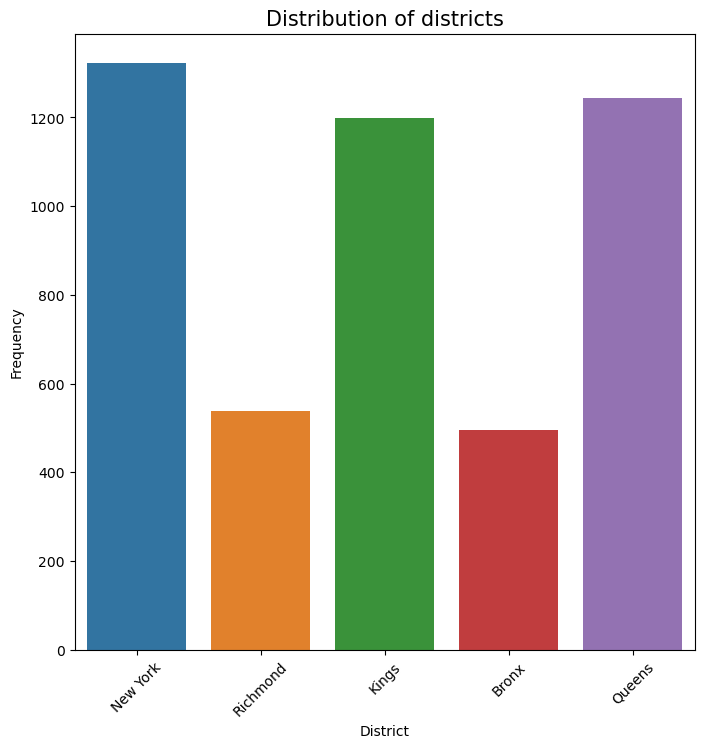

In [25]:
fig = plt.subplots(figsize=(8, 8))
fig = sns.countplot(data=data, x='District', log=False)
plt.xticks(rotation=45,fontsize=10)
plt.title('Distribution of districts',fontsize=15)
plt.ylabel('Frequency',fontsize=10)
plt.xlabel('District',fontsize=10)
plt.show()

Больше всего свободной недвижимости в **New York**, **Queens**, **Kings**

In [26]:
borough_data = data.groupby('District').agg({
    'PRICE' : 'mean',
    'BEDS' : 'mean',
    'BATH' : 'mean',
    'PROPERTYSQFT' : 'mean'
}).reset_index()

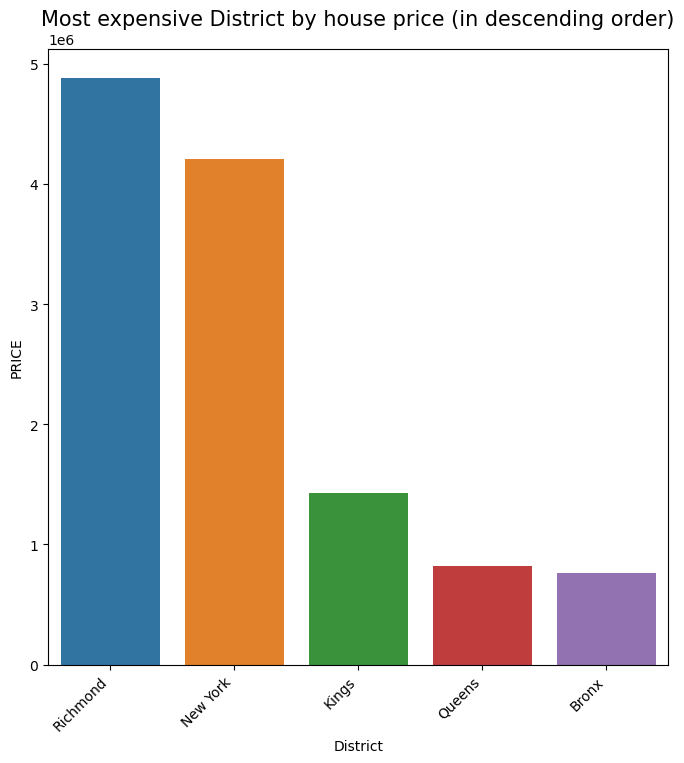

In [27]:
plt.figure(figsize=(8, 8))
sns.barplot(x='District', y='PRICE', data=borough_data.sort_values('PRICE', ascending = False))
plt.xticks(rotation=45, ha='right')
plt.title('Most expensive District by house price (in descending order)',fontsize=15)
plt.show()

Самые дорогие недвижимости в среднем: **Richmond**, **New York**, **Kings**

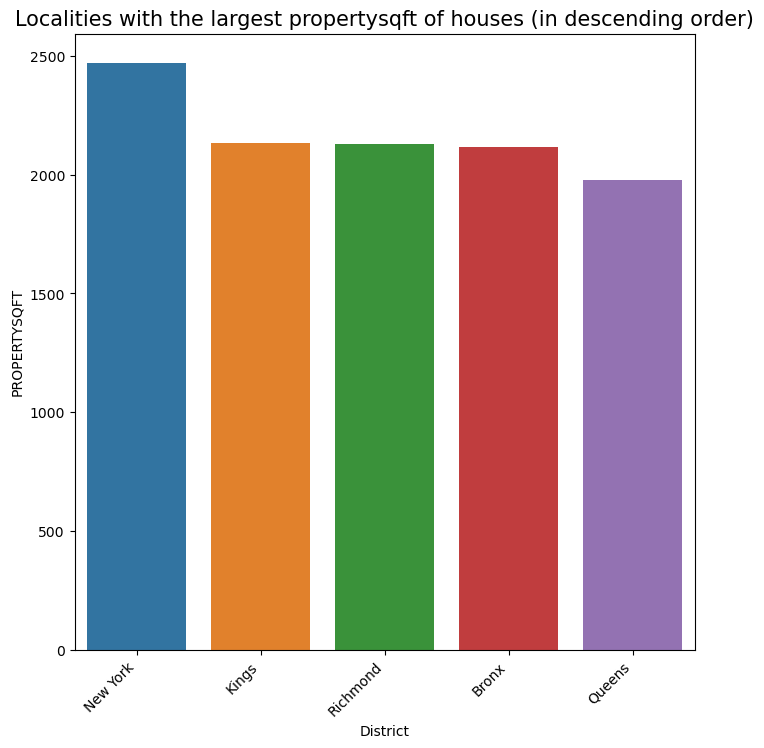

In [28]:
plt.figure(figsize=(8, 8))
sns.barplot(x='District', y='PROPERTYSQFT', data=borough_data.sort_values(by='PROPERTYSQFT',
                                                                           ascending=False))
plt.xticks(rotation=45, ha='right')
plt.title('Localities with the largest propertysqft of houses (in descending order)',fontsize=15)
plt.show()

In [29]:
fig = px.box(data, y='PRICE', x='District', color='District')
fig.update_yaxes(range=[0, 10000000])
fig.update_layout(title='Boxplot of Housing Prices by District')
fig.show()

Можем увидеть, что каждый район имеет "особенные дома", у которых цены намного выше, чем средняя стоимость дома в этом районе.

### Получение признака - близкое расстояние до достопримечательностей [Haversine formula](https://en.wikipedia.org/wiki/Haversine_formula)

### Суть получения признака заключается в следующем. Мы выбираем достопримечательность в каждом районе (боро) и вычисляем расстояние между ней и домами. После находим медиану в каждом распределении расстояний и создаём пограничное значение, считая среднее арифметическое между медианами. Для определение близости дома к достопримечательностям мы находим среднее арифметическое расстояний между ними и после сравниваем полученную значение с пограничным значением. Если пограничное значение больше, чем среднее арифметическое расстояний, то присваиваем 1 - иначе 0 

In [30]:
def haversine_distance(lat1, lon1, lat2, lon2): 
    R = 6371.0 #kilometer
    
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c

    return distance 

In [31]:
lat2, lon2 = 40.7825, -73.9661 
data['Central Park'] = data.apply(lambda row: haversine_distance(row['LATITUDE'], row['LONGITUDE'], lat2, lon2), axis=1)

In [32]:
lat2, lon2 = 40.6677, -73.9636
data['Brooklyn Botanic Garden'] = data.apply(lambda row: haversine_distance(row['LATITUDE'], row['LONGITUDE'], lat2, lon2), axis=1)

In [33]:
lat2, lon2 = 40.7437, -73.8486
data['Queens Zoo'] = data.apply(lambda row: haversine_distance(row['LATITUDE'], row['LONGITUDE'], lat2, lon2), axis=1)

In [34]:
lat2, lon2 = 40.850278, -73.878333
data['Bronx Zoo'] = data.apply(lambda row: haversine_distance(row['LATITUDE'], row['LONGITUDE'], lat2, lon2), axis=1)

In [35]:
lat2, lon2 = 40.6425, -74.1028
data['Sailors Snug Harbor'] = data.apply(lambda row: haversine_distance(row['LATITUDE'], row['LONGITUDE'], lat2, lon2), axis=1)

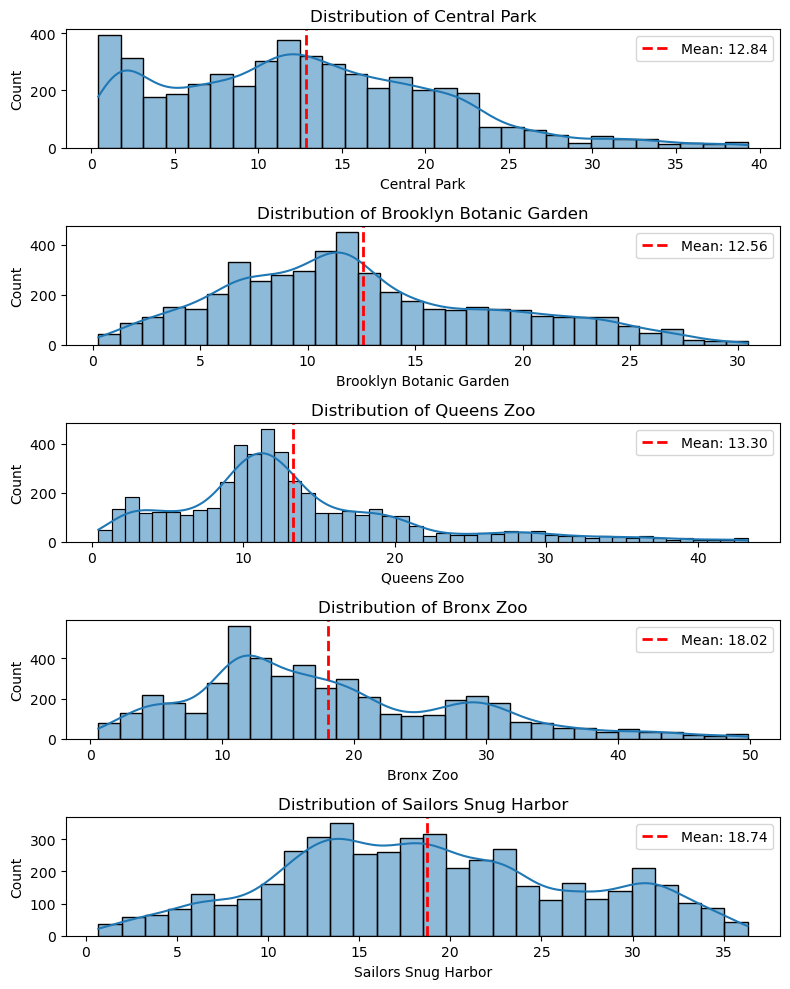

In [36]:
selected_columns = ['Central Park', 'Brooklyn Botanic Garden', 'Queens Zoo', 'Bronx Zoo', 'Sailors Snug Harbor']
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 10)) 
mean_values = []
for col, ax in zip(selected_columns, axes.flatten()):
    sns.histplot(data[col], kde=True, ax=ax)
    
    mean_value = data[col].mean()
    mean_values.append(mean_value)
    
    ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
    ax.set_title(f'Distribution of {col}')
    ax.legend()

plt.tight_layout()

plt.show()

In [37]:
mean_of_distribution = round(sum(mean_values) / len(mean_values),2)

In [38]:
data['Close to the sights'] = np.where(mean_of_distribution > data[selected_columns].mean(axis=1), 1, 0)

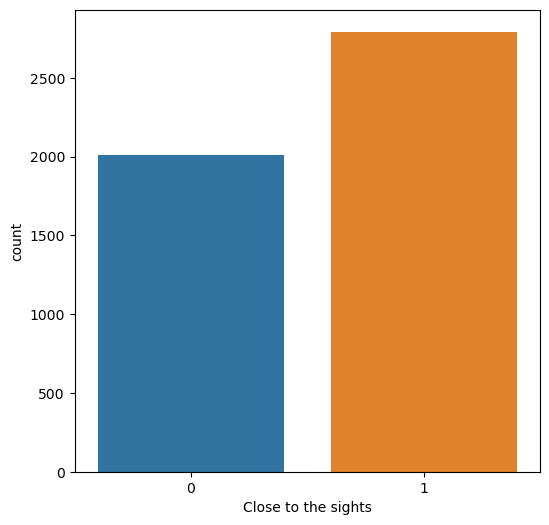

In [39]:
plt.figure(figsize=(6,6))
sns.countplot(data = data, x = 'Close to the sights');

Большинство недвижимости распологается близко достопримечательностям

In [40]:
data_clear = data.copy()

Удалим выбросы

In [41]:
numeric_columns = data.select_dtypes(include=['number']).columns

Q1_numeric = data[numeric_columns].quantile(0.25)
Q3_numeric = data[numeric_columns].quantile(0.75)
IQR_numeric = Q3_numeric - Q1_numeric
outlier_cutoff_numeric = 10 * IQR_numeric

house_data_filtered = data[~((data[numeric_columns] < (Q1_numeric - outlier_cutoff_numeric)) | (data[numeric_columns] > (Q3_numeric + outlier_cutoff_numeric))).any(axis=1)]

data = house_data_filtered

In [42]:
data = data.drop(['BROKERTITLE','ADDRESS','STATE','MAIN_ADDRESS','ADMINISTRATIVE_AREA_LEVEL_2',
          'SUBLOCALITY','STREET_NAME','LONG_NAME','FORMATTED_ADDRESS','LATITUDE','LONGITUDE',
          'Central Park','Brooklyn Botanic Garden','Queens Zoo','Bronx Zoo','Sailors Snug Harbor','LOCALITY']
          ,axis=1)

### Добавим дополнительные признаки из [wiki](https://en.wikipedia.org/wiki/Boroughs_of_New_York_City)

In [43]:
extra_features = pd.read_excel('Extra Features.xlsx')
data = data.merge(extra_features, on = 'District', how = 'left')

In [44]:
data = pd.get_dummies(data, columns=['District'], drop_first=True, prefix=None)
data = pd.get_dummies(data, columns=['TYPE'], drop_first=True, prefix=None)
data.replace({True: 1, False: 0}, inplace=True)

data_df = data.copy()

In [45]:
data_for_corr = data.corr()
data_for_corr = np.round(data_for_corr, 2)
np.fill_diagonal(data_for_corr.values, 0)

fig = px.imshow(data_for_corr, text_auto=True,aspect="auto", color_continuous_scale='Bluered_r', zmin = -1, zmax = 1, height=800, width=800)
fig.show()

# 2. Построение моделей, подбор параметров для обучения, выбор лучшей 

### Построим модель, для предсказания цены

In [46]:
y = data['PRICE']
X = data.drop('PRICE',axis=1)

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
pipe_cat = Pipeline([
    ('Scaler', StandardScaler()),
    ('ragdoll', CatBoostRegressor(verbose = False))
])

param_grid_cat = {
    'ragdoll__learning_rate': [0.1, 0.2],
    'ragdoll__depth': [5, 7],
    'ragdoll__iterations': [500, 800, 1100]
}

grid_search_cat = GridSearchCV(pipe_cat, param_grid_cat, cv=5, scoring='r2', n_jobs=-1)

grid_search_cat.fit(X_train, y_train)

best_model_cat = grid_search_cat.best_estimator_


In [49]:
predictions_cat = best_model_cat.predict(X_test)

neg_mean_absolute_error_Cat = mean_absolute_error(y_test, predictions_cat)
neg_mean_squared_error_Cat = mean_squared_error(y_test, predictions_cat)
r2_Cat = r2_score(y_test, predictions_cat)

print(f'neg_mean_absolute_error: {round(neg_mean_absolute_error_Cat,2)}')
print(f'neg_mean_squared_error: {round(neg_mean_squared_error_Cat,2)}')
print(f'r2: {round(r2_Cat,3)}')

best_params = grid_search_cat.best_params_

print("Лучшие параметры:", best_params)

neg_mean_absolute_error: 469768.38
neg_mean_squared_error: 853486762537.58
r2: 0.711
Лучшие параметры: {'ragdoll__depth': 5, 'ragdoll__iterations': 500, 'ragdoll__learning_rate': 0.1}


In [50]:
pipe_XGB = Pipeline(
[('Scaler', StandardScaler()),
 ('XGB', XGBRegressor())])

param_grid = {
    'XGB__n_estimators': [300, 600, 900],
    'XGB__learning_rate': [0.1, 0.3, 0.6],
    'XGB__max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(pipe_XGB, param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)


grid_search.fit(X_train, y_train)

best_model_XGB = grid_search.best_estimator_

In [51]:
predictions_XGB = best_model_XGB.predict(X_test)

neg_mean_absolute_error_XGB = mean_absolute_error(y_test, predictions_XGB)
neg_mean_squared_error_XGB = mean_squared_error(y_test, predictions_XGB)
r2_XGB = r2_score(y_test, predictions_XGB)

print(f'neg_mean_absolute_error: {round(neg_mean_absolute_error_XGB,2)}')
print(f'neg_mean_squared_error: {round(neg_mean_squared_error_XGB,2)}')
print(f'r2: {round(r2_XGB,3)}')

best_params = grid_search.best_params_

print("Лучшие параметры:", best_params)

neg_mean_absolute_error: 484507.59
neg_mean_squared_error: 953762681297.45
r2: 0.677
Лучшие параметры: {'XGB__learning_rate': 0.1, 'XGB__max_depth': 5, 'XGB__n_estimators': 300}


In [52]:
pipe_mlp = Pipeline([
    ('Scaler', StandardScaler()),
    ('mlp', MLPRegressor(verbose=False))
])

param_grid_mlp = {
    'mlp__activation': ['relu'],
    'mlp__learning_rate': ['adaptive'],
    'mlp__solver': ['adam'],
    'mlp__max_iter': [100, 300, 600]
}

grid_search_mlp = GridSearchCV(pipe_mlp, param_grid_mlp, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1,verbose=0)

grid_search_mlp.fit(X_train, y_train)

best_model_mlp = grid_search_mlp.best_estimator_

/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_

In [53]:
predictions_mlp = best_model_mlp.predict(X_test)

neg_mean_absolute_error_MLP = mean_absolute_error(y_test, predictions_mlp)
neg_mean_squared_error_MLP = mean_squared_error(y_test, predictions_mlp)
r2_MLP = r2_score(y_test, predictions_mlp)

print(f'neg_mean_absolute_error: {round(neg_mean_absolute_error_MLP,2)}')
print(f'neg_mean_squared_error: {round(neg_mean_squared_error_MLP,2)}')
print(f'r2: {round(r2_MLP,2)}')

best_params = grid_search_mlp.best_params_

print("Лучшие параметры:", best_params)

neg_mean_absolute_error: 1345565.4
neg_mean_squared_error: 4647765706460.21
r2: -0.57
Лучшие параметры: {'mlp__activation': 'relu', 'mlp__learning_rate': 'adaptive', 'mlp__max_iter': 600, 'mlp__solver': 'adam'}


In [54]:
pipe_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor())
])

param_grid_rf = {
    'rf__n_estimators': [100, 300, 500],
    'rf__max_depth': [5, 10, 15, 20],
    'rf__bootstrap': [True]
}

grid_search_rf = GridSearchCV(pipe_rf, param_grid_rf, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=0)

grid_search_rf.fit(X_train, y_train)

best_model_rf = grid_search_rf.best_estimator_

In [55]:
predictions_rf = best_model_rf.predict(X_test)

neg_mean_absolute_error_RF = mean_absolute_error(y_test, predictions_rf)
neg_mean_squared_error_RF = mean_squared_error(y_test, predictions_rf)
r2_RF = r2_score(y_test, predictions_rf)

print(f'neg_mean_absolute_error: {round(neg_mean_absolute_error_RF,2)}')
print(f'neg_mean_squared_error: {round(neg_mean_squared_error_RF,2)}')
print(f'r2: {round(r2_RF,2)}')

best_params = grid_search_rf.best_params_

print("Лучшие параметры:", best_params)

neg_mean_absolute_error: 490557.39
neg_mean_squared_error: 924464920116.62
r2: 0.69
Лучшие параметры: {'rf__bootstrap': True, 'rf__max_depth': 10, 'rf__n_estimators': 100}


In [56]:
columns = ['model', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'r2']

data = [
    ['XGB', neg_mean_absolute_error_XGB, neg_mean_squared_error_XGB, r2_XGB],
    ['CatBoostRegressor', neg_mean_absolute_error_Cat, neg_mean_squared_error_Cat, r2_Cat], 
    ['MLP', neg_mean_absolute_error_MLP, neg_mean_squared_error_MLP, r2_MLP],
    ['RF', neg_mean_absolute_error_RF, neg_mean_squared_error_RF, r2_RF]
]

df = pd.DataFrame(data, columns=columns)

models = df['model']
mae = df['neg_mean_absolute_error']
mse = df['neg_mean_squared_error']
r2 = df['r2']

pyo.init_notebook_mode(connected=True)
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=['MAE', 'MSE', 'R2'])

fig.add_trace(go.Bar(x=models, y=mae, name='MAE'), row=1, col=1)
fig.add_trace(go.Bar(x=models, y=mse, name='MSE'), row=2, col=1)
fig.add_trace(go.Bar(x=models, y=r2, name='R2'), row=3, col=1)

fig.update_layout(
    barmode='group',
    title_text='Comparison of metrics for different models',
    showlegend=False 
)

fig.show()


Основания метрика **MAE**, поэтому лучшая модель Catboost

# 3. Проведение кластеризации и вывод полученных кластеров на карту

In [57]:
selected_data = data_df.columns.to_list()
X = data_df[selected_data]

kmeans = KMeans(n_clusters=4, random_state=42)

norm = Normalizer()

pipeline_kmeans = Pipeline([('scaler', norm), ('kmeans', kmeans)])

pipeline_kmeans.fit(X)

data_df['cluster'] = pipeline_kmeans.predict(X)

In [58]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

In [59]:
mean_df = data_df.groupby('cluster').mean()

# Определение категорий кластеров
elite_category_kmeans = mean_df['PRICE'].idxmax()  # Кластер с самой большой средней считаем "Элитным"
economic_category_kmeans = mean_df['PRICE'].idxmin()  # Кластер с самой маленькой средней считаем "Эконом"
comfort_category_kmeans = mean_df[mean_df['PRICE'] > mean_df['PRICE'].loc[economic_category_kmeans]].idxmin()['PRICE']
# Кластер с медианой чуть больше средней "Эконом" считаем "Комфорт"
business_category_kmeans = mean_df[mean_df['PRICE'] < mean_df['PRICE'].loc[elite_category_kmeans]].idxmax()['PRICE']
# Кластер с медианой чуть меньше среднего "Элитный" считаем "Бизнес"
data_df['kmeans_category'] = data_df['cluster'].map({elite_category_kmeans: 'Элитный',
                                               economic_category_kmeans: 'Эконом',
                                               comfort_category_kmeans: 'Комфорт',
                                               business_category_kmeans: 'Бизнес'})

Data_KNN = data_df

fig = px.scatter(Data_KNN, x=X_pca[:, 0], y=X_pca[:, 1], color='kmeans_category',
                 color_discrete_sequence=px.colors.qualitative.Set1, title='KMeans Clustering with Categories')

fig.update_layout(showlegend=True, height=600, width=800)

fig.show()

In [60]:
silhouette = silhouette_score(X, data_df['cluster'])
db_index = davies_bouldin_score(X, data_df['cluster'])
ch_index = calinski_harabasz_score(X, data_df['cluster'])

print(f"Silhouette Score: {silhouette:.2f}")
print(f"Davies-Bouldin Index: {db_index:.2f}")
print(f"Calinski-Harabasz Index: {ch_index:.2f}")

Silhouette Score: 0.20
Davies-Bouldin Index: 1.77
Calinski-Harabasz Index: 1453.63


In [61]:
counts = Data_KNN['kmeans_category'].value_counts()

fig = px.pie(labels=counts.index, values=counts, names=counts.index.map(str),
             title='Distribution of classes of houses',
             hover_data=[counts],
             color_discrete_sequence=px.colors.qualitative.Set1,
             hole=0.3)

fig.update_traces(textposition='inside', textinfo='label+percent')

fig.show()

In [62]:
Data_KNN_Group = Data_KNN.groupby('kmeans_category')['PRICE'].mean()
Data_KNN_Group = Data_KNN_Group.reset_index()

fig = px.bar(Data_KNN_Group, x='kmeans_category', y='PRICE', title='Average Prices by Category',
             color='kmeans_category', color_discrete_sequence=['blue', 'red', 'green', 'purple'])

fig.show()

In [63]:
Data_KNN = data_df
data_df = data_df.drop(['cluster','kmeans_category'],axis=1)
selected_data = data_df.columns.to_list()
X = data_df[selected_data]

In [64]:
gmm = GaussianMixture(n_components=4, random_state=42)

pipeline = Pipeline([('scaler', norm), ('kmeans', gmm)])

pipeline.fit(X)

data_df['gmm_category'] = pipeline.predict(X)
X_pca_gmm = pca.transform(X)

In [65]:
median_df = data_df.groupby('gmm_category').median()

elite_category = median_df['PRICE'].idxmax()  
economic_category = median_df['PRICE'].idxmin()  
comfort_category = median_df[median_df['PRICE'] > median_df['PRICE'].loc[economic_category]].idxmin()['PRICE']
business_category = median_df[median_df['PRICE'] < median_df['PRICE'].loc[elite_category]].idxmax()['PRICE']

data_df['gmm_category'] = data_df['gmm_category'].map({elite_category: 'Элитный',
                                               economic_category: 'Эконом',
                                               comfort_category: 'Комфорт',
                                               business_category: 'Бизнес'})

Data_GMM = data_df
fig = px.scatter(Data_GMM, x=X_pca[:, 0], y=X_pca[:, 1], color='gmm_category',
                color_discrete_sequence=px.colors.qualitative.Set1, title='GaussianMixture Clustering with Categories')

fig.update_layout(showlegend=True, height=600, width=800)

fig.show()


In [66]:
silhouette_gmm = silhouette_score(X, data_df['gmm_category'])
db_index_gmm = davies_bouldin_score(X, data_df['gmm_category'])
ch_index_gmm = calinski_harabasz_score(X, data_df['gmm_category'])

print(f"Silhouette Score (GMM): {silhouette_gmm:.2f}")
print(f"Davies-Bouldin Index (GMM): {db_index_gmm:.2f}")
print(f"Calinski-Harabasz Index (GMM): {ch_index_gmm:.2f}")

Silhouette Score (GMM): 0.16
Davies-Bouldin Index (GMM): 1.84
Calinski-Harabasz Index (GMM): 1221.39


In [67]:
counts = Data_GMM['gmm_category'].value_counts()

fig = px.pie(labels=counts.index, values=counts, names=counts.index.map(str),
             title='Distribution of classes of houses',
             hover_data=[counts],
             color_discrete_sequence=px.colors.qualitative.Set1,
             hole=0.3)

fig.update_traces(textposition='inside', textinfo='label+percent')

fig.show()

In [68]:
Data_GMM_Group = Data_GMM.groupby('gmm_category')['PRICE'].median()
Data_GMM_Group = Data_GMM_Group.reset_index()

fig = px.bar(Data_GMM_Group, x='gmm_category', y='PRICE', title='Average Prices by Category',
             color='gmm_category', color_discrete_sequence=['blue', 'red', 'green', 'purple'])

fig.show()

Основания метрика коэффициент Силуэта, поэтому лучшая модель K-Means

### Построим карту недвижимости, с полученными кластерами от K-Means

In [69]:
data_clear = pd.concat([data_clear,Data_KNN['kmeans_category']],axis=1)

map_center = [data_clear['LATITUDE'].mean(), data_clear['LONGITUDE'].mean()]
my_map = folium.Map(location=map_center, zoom_start=10)

marker_cluster = MarkerCluster().add_to(my_map)

colors = {'эконом': 'green', 'комфорт': 'red', 'бизнес': 'blue', 'элитный': 'purple'}

for index, row in data_clear.iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=f"Class: {row['kmeans_category']}",
        icon=folium.Icon(color=colors.get(row['kmeans_category'], 'gray'), icon='home')
    ).add_to(marker_cluster)

# уберите "#" чтобы скачать html файлик с картой    
# my_map.get_root().html.add_child(folium.Element(legend_html))
# my_map.save("map_with_markers.html")
my_map


Скачаем модели (уберите "#")

In [70]:
# joblib.dump(best_model_cat, 'Catboost_Regression.pkl')
# joblib.dump(pipeline_kmeans, 'Kmeans.pkl')

# 4. Построение прототип сервиса на библиотеке Streamlit

## Streamlit App [ссылка](https://eda-price-prediction-clustering-app-qilf9ka3e7yujynxma9cfd.streamlit.app/)
### Если боковое меню пусто - закройте и заново откройте меню

# 5. Итог

## Зависимость цены от характеристик недвижимости
Было обнаружено, что цена недвижимости прямо зависит от таких характеристик, как количество спален, кроватей и общая площадь квартиры.

## Типы недвижимости и их ценовая динамика
Были выделены топ-3 типа недвижимости: Co-op, House и Condo. Из них самые дорогие по средней цене оказались Townhouse, House и Condo.

## Распределение цен по районам
С помощью графиков было выявлено, что в среднем самая дорогая недвижимость находится в Нью-Йорке, затем в Ричмонде и Кингсе. Также было отмечено, что большинство недвижимости располагается близко к достопримечательностям, что оказывает влияние на цены.

## Спрос и предложение недвижимости
Анализ показал, что наибольшее количество свободной недвижимости наблюдается в Нью-Йорке, Квинсе и Кингсе.

## Особенные дома и высокие цены
Каждый район имеет "особенные дома", у которых цены значительно выше средней стоимости домов в этом районе.

## Модели для анализа и прогнозирования
Исследование показало, что для прогнозирования цен на недвижимость лучше всего подходит модель CatBoost, а для кластеризации данных - метод K-Mean.